# Pipeline Principal: Registro y Medición del Comedor

**Proyecto:** Fusión de Perspectivas - Registro de Imágenes y Medición del Mundo Real

**Universidad Nacional de Colombia** - Visión por Computador 2025-02

---

## Objetivos
1. Registrar y fusionar tres imágenes del comedor desde diferentes perspectivas
2. Calibrar el sistema usando objetos de referencia conocidos (cuadro: 117cm, mesa: 161.1cm)
3. Realizar mediciones de elementos en la escena en centímetros

---

## PARTE A: REGISTRO DE IMÁGENES

In [1]:
# Importar bibliotecas necesarias
import sys
import os
sys.path.append('../src')

import numpy as np
import cv2
import matplotlib.pyplot as plt
import shutil
import warnings
warnings.filterwarnings('ignore')

from feature_detection import detectar_caracteristicas, visualizar_keypoints, comparar_detectores
from matching import emparejar_caracteristicas, filtrar_matches_ransac, visualizar_matches, calcular_estadisticas_matches
from registration import registro_con_caracteristicas
from measurement import CalibradorImagen, HerramientaMedicionInteractiva, estimar_incertidumbre
from utils import visualizar_resultados

# Configuración para mejores visualizaciones
plt.rcParams['figure.figsize'] = (15, 5)
plt.rcParams['font.size'] = 10

print("✅ Bibliotecas importadas correctamente")
print(f"OpenCV version: {cv2.__version__}")
print(f"NumPy version: {np.__version__}")

✅ Bibliotecas importadas correctamente
OpenCV version: 4.12.0
NumPy version: 2.2.6


## 1. Carga de Imágenes del Comedor

Cargamos las tres imágenes del comedor tomadas desde diferentes posiciones.

In [2]:
# Copiar imágenes desde la carpeta imagenes a data/original
imagenes_origen = [
    '../../imagenes/cuadro_virgen_guadalupe.jpg',
    '../../imagenes/IMG02.jpg',
    '../../imagenes/IMG03.jpg'
]

print("Copiando imágenes a data/original/...\n")
for img_path in imagenes_origen:
    nombre = os.path.basename(img_path)
    destino = f'../data/original/{nombre}'
    if os.path.exists(img_path) and not os.path.exists(destino):
        shutil.copy(img_path, destino)
        print(f"✓ Copiada: {nombre}")
    elif os.path.exists(destino):
        print(f"○ Ya existe: {nombre}")
    else:
        print(f"✗ No encontrada: {img_path}")

print("\n✅ Proceso de copia completado")

Copiando imágenes a data/original/...

○ Ya existe: cuadro_virgen_guadalupe.jpg
○ Ya existe: IMG02.jpg
○ Ya existe: IMG03.jpg

✅ Proceso de copia completado


In [3]:
# Cargar imágenes
img1 = cv2.imread('../data/original/cuadro_virgen_guadalupe.jpg')
img2 = cv2.imread('../data/original/IMG02.jpg')
img3 = cv2.imread('../data/original/IMG03.jpg')

# Convertir a RGB para visualización
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# Convertir a escala de grises para procesamiento
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img3_gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

print(f"✓ Imagen 1: {img1.shape}")
print(f"✓ Imagen 2: {img2.shape}")
print(f"✓ Imagen 3: {img3.shape}")

✓ Imagen 1: (4032, 3024, 3)
✓ Imagen 2: (4032, 3024, 3)
✓ Imagen 3: (3024, 4032, 3)


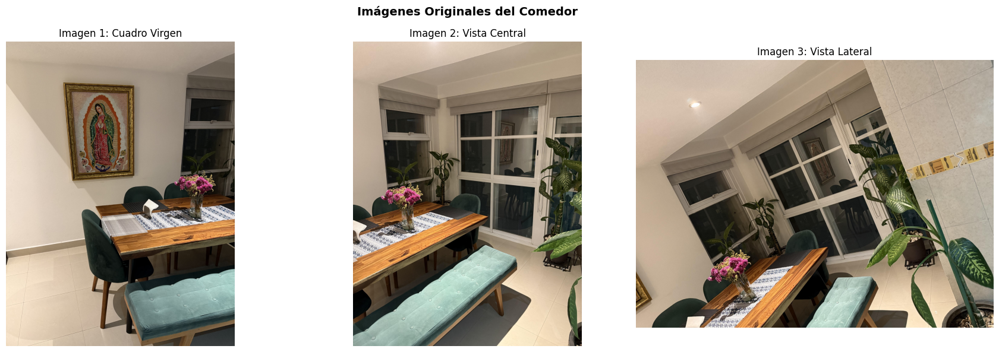

In [4]:
# Visualizar imágenes originales
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(img1_rgb)
axes[0].set_title('Imagen 1: Cuadro Virgen', fontsize=12)
axes[0].axis('off')

axes[1].imshow(img2_rgb)
axes[1].set_title('Imagen 2: Vista Central', fontsize=12)
axes[1].axis('off')

axes[2].imshow(img3_rgb)
axes[2].set_title('Imagen 3: Vista Lateral', fontsize=12)
axes[2].axis('off')

plt.suptitle('Imágenes Originales del Comedor', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('../results/figures/01_imagenes_originales.png', dpi=150, bbox_inches='tight')
plt.show()

## 2. Detección de Características

Comparamos diferentes detectores (SIFT, ORB, AKAZE) en las imágenes.

In [5]:
# Comparar detectores en la primera imagen
print("\n" + "="*60)
print("COMPARANDO DETECTORES DE CARACTERÍSTICAS")
print("="*60 + "\n")

resultados_img1 = comparar_detectores(img1_gray, detectores=['orb', 'sift', 'akaze'])


COMPARANDO DETECTORES DE CARACTERÍSTICAS

✓ ORB: 500 características detectadas
✓ SIFT: 500 características detectadas
✓ AKAZE: 18397 características detectadas


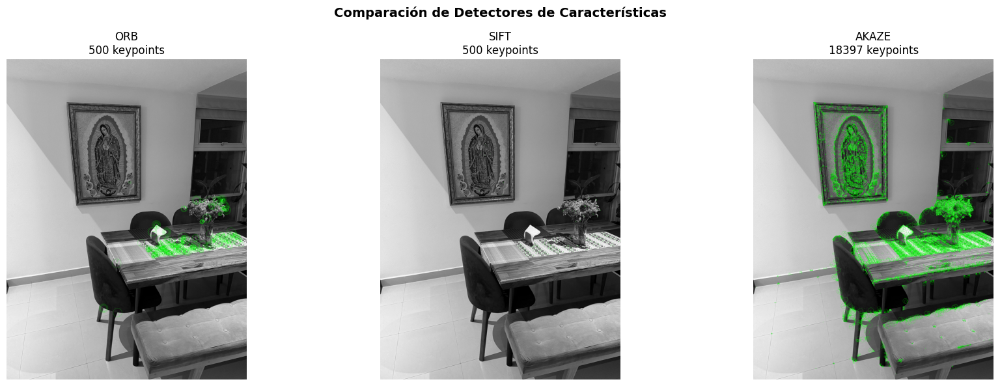

In [6]:
# Visualizar keypoints de cada detector
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, (metodo, resultado) in enumerate(resultados_img1.items()):
    if resultado is not None:
        img_kp = visualizar_keypoints(img1_gray, resultado['keypoints'])
        axes[i].imshow(img_kp)
        axes[i].set_title(f"{metodo.upper()}\n{resultado['num_keypoints']} keypoints", fontsize=12)
    else:
        axes[i].imshow(img1_rgb)
        axes[i].set_title(f"{metodo.upper()}\nError", fontsize=12)
    axes[i].axis('off')

plt.suptitle('Comparación de Detectores de Características', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('../results/figures/02_comparacion_detectores.png', dpi=150, bbox_inches='tight')
plt.show()

## 3. Registro: Imagen 1 → Imagen 2

Registramos la primera imagen (cuadro) con la segunda (central) usando SIFT.


REGISTRO: IMAGEN 1 → IMAGEN 2

✓ Características detectadas: 2000 en img1, 2001 en img2
✓ Matches encontrados: 784
✓ Inliers (RANSAC): 602/784

✅ Registro exitoso


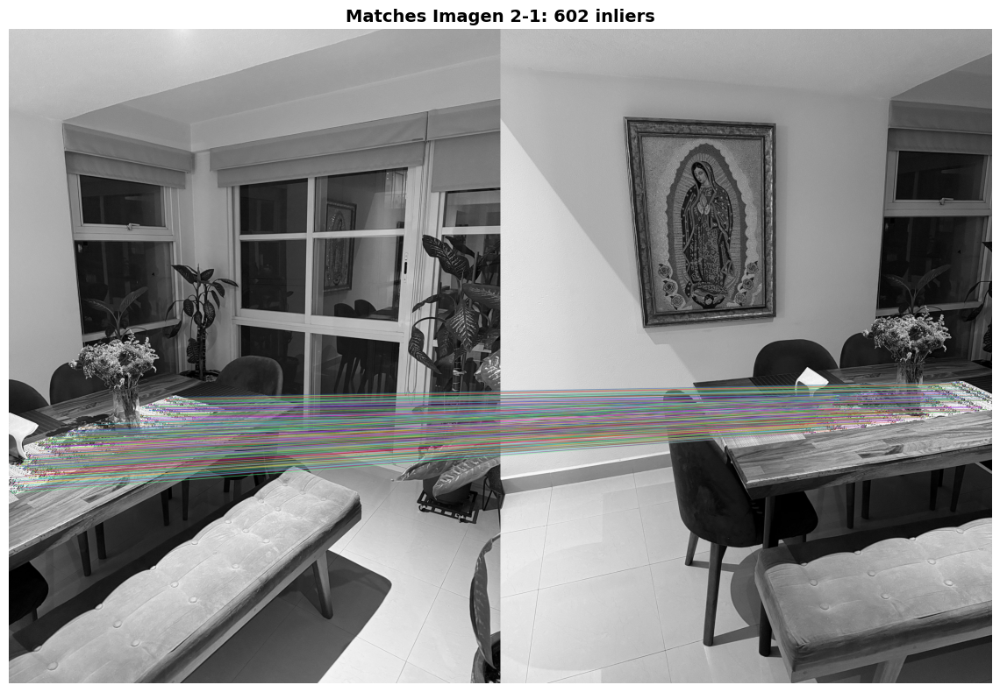

In [7]:
print("\n" + "="*60)
print("REGISTRO: IMAGEN 1 → IMAGEN 2")
print("="*60 + "\n")

# Usar SIFT (mejor para imágenes reales)
H12, img1_reg, info12 = registro_con_caracteristicas(
    img2_gray, img1_gray, 
    metodo='sift', 
    max_features=2000
)

if H12 is not None:
    print("\n✅ Registro exitoso")
    
    # Visualizar matches
    img_matches = visualizar_matches(
        img2_gray, info12['keypoints1'],
        img1_gray, info12['keypoints2'],
        info12['matches'], info12['mask']
    )
    
    plt.figure(figsize=(16, 8))
    plt.imshow(img_matches)
    plt.title(f"Matches Imagen 2-1: {info12['num_inliers']} inliers", fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/03_matches_img2_img1.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("\n❌ Registro falló")

## 4. Registro: Imagen 3 → Imagen 2

Registramos la tercera imagen (lateral) con la segunda (referencia).


REGISTRO: IMAGEN 3 → IMAGEN 2

✓ Características detectadas: 2000 en img1, 2001 en img2
✓ Matches encontrados: 742
✓ Inliers (RANSAC): 536/742

✅ Registro exitoso


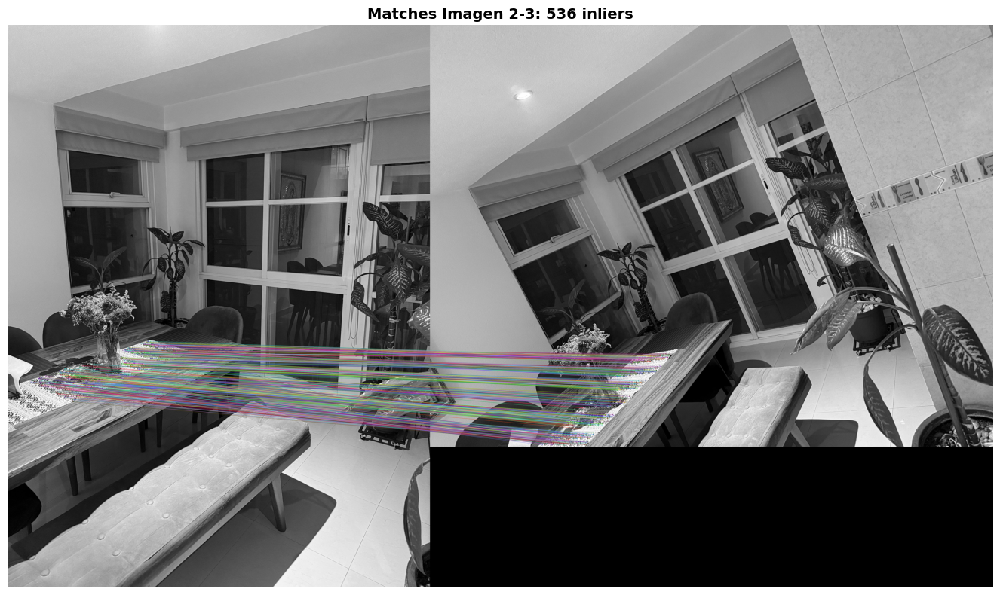

In [8]:
print("\n" + "="*60)
print("REGISTRO: IMAGEN 3 → IMAGEN 2")
print("="*60 + "\n")

H32, img3_reg, info32 = registro_con_caracteristicas(
    img2_gray, img3_gray,
    metodo='sift',
    max_features=2000
)

if H32 is not None:
    print("\n✅ Registro exitoso")
    
    # Visualizar matches
    img_matches = visualizar_matches(
        img2_gray, info32['keypoints1'],
        img3_gray, info32['keypoints2'],
        info32['matches'], info32['mask']
    )
    
    plt.figure(figsize=(16, 8))
    plt.imshow(img_matches)
    plt.title(f"Matches Imagen 2-3: {info32['num_inliers']} inliers", fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/04_matches_img2_img3.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("\n❌ Registro falló")

## 5. Fusión de las Tres Imágenes

Creamos un panorama fusionando las tres imágenes usando las homografías calculadas.


FUSIÓN DE IMÁGENES



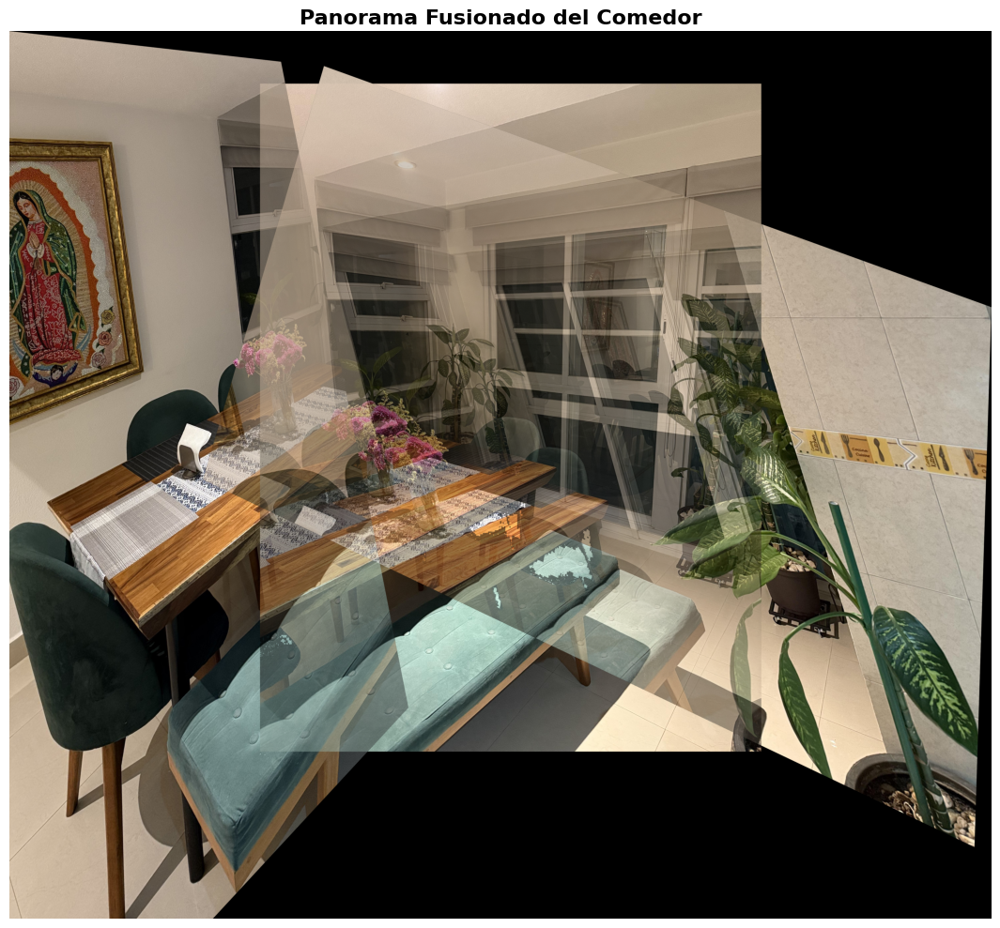


✅ Panorama creado exitosamente
Dimensiones: 5925x5358
Guardado en: results/figures/05_panorama_fusionado.jpg


In [9]:
print("\n" + "="*60)
print("FUSIÓN DE IMÁGENES")
print("="*60 + "\n")

if H12 is not None and H32 is not None:
    # Usar imagen 2 como referencia
    h, w = img2_gray.shape
    
    # Canvas más grande para acomodar todas las imágenes
    canvas_h = int(h * 1.5)
    canvas_w = int(w * 2.5)
    offset_x = int(w * 0.5)
    offset_y = int(h * 0.25)
    
    # Crear canvas
    panorama = np.zeros((canvas_h, canvas_w, 3), dtype=np.uint8)
    
    # Colocar imagen 2 (referencia) en el centro
    panorama[offset_y:offset_y+h, offset_x:offset_x+w] = img2
    
    # Transformar y colocar imagen 1
    H12_offset = H12.copy()
    H12_offset[0, 2] += offset_x
    H12_offset[1, 2] += offset_y
    img1_warped = cv2.warpPerspective(img1, H12_offset, (canvas_w, canvas_h))
    
    # Fusionar con blending
    mask1 = (img1_warped.sum(axis=2) > 0).astype(np.uint8)
    mask_panorama = (panorama.sum(axis=2) > 0).astype(np.uint8)
    overlap = mask1 * mask_panorama
    
    for c in range(3):
        panorama[:, :, c] = np.where(overlap == 1,
                                     (panorama[:, :, c].astype(float) + img1_warped[:, :, c].astype(float)) / 2,
                                     np.where(mask1 == 1, img1_warped[:, :, c], panorama[:, :, c]))
    
    # Transformar y colocar imagen 3
    H32_offset = H32.copy()
    H32_offset[0, 2] += offset_x
    H32_offset[1, 2] += offset_y
    img3_warped = cv2.warpPerspective(img3, H32_offset, (canvas_w, canvas_h))
    
    mask3 = (img3_warped.sum(axis=2) > 0).astype(np.uint8)
    mask_panorama = (panorama.sum(axis=2) > 0).astype(np.uint8)
    overlap = mask3 * mask_panorama
    
    for c in range(3):
        panorama[:, :, c] = np.where(overlap == 1,
                                     (panorama[:, :, c].astype(float) + img3_warped[:, :, c].astype(float)) / 2,
                                     np.where(mask3 == 1, img3_warped[:, :, c], panorama[:, :, c]))
    
    panorama = panorama.astype(np.uint8)
    
    # Recortar bordes negros
    gray_pano = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray_pano, 1, 255, cv2.THRESH_BINARY)
    coords = cv2.findNonZero(thresh)
    x, y, w_crop, h_crop = cv2.boundingRect(coords)
    panorama_cropped = panorama[y:y+h_crop, x:x+w_crop]
    
    # Guardar resultado
    cv2.imwrite('../results/figures/05_panorama_fusionado.jpg', panorama_cropped)
    
    # Visualizar
    plt.figure(figsize=(20, 10))
    plt.imshow(cv2.cvtColor(panorama_cropped, cv2.COLOR_BGR2RGB))
    plt.title('Panorama Fusionado del Comedor', fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/05_panorama_fusionado.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n✅ Panorama creado exitosamente")
    print(f"Dimensiones: {panorama_cropped.shape[1]}x{panorama_cropped.shape[0]}")
    print(f"Guardado en: results/figures/05_panorama_fusionado.jpg")
else:
    print("\n❌ No se puede crear panorama: faltan homografías")

## 6. Estadísticas del Registro

Resumen de las métricas del proceso de registro.

In [10]:
print("\n" + "="*60)
print("ESTADÍSTICAS DEL REGISTRO")
print("="*60)

if H12 is not None and H32 is not None:
    print("\n✅ Registro completado exitosamente\n")
    
    print("📊 ESTADÍSTICAS:")
    print("\nImagen 1 → Imagen 2:")
    stats12 = calcular_estadisticas_matches(info12['matches'], info12['mask'])
    print(f"  Matches totales:      {stats12['num_matches']}")
    print(f"  Inliers (RANSAC):     {stats12['num_inliers']} ({stats12['porcentaje_inliers']:.1f}%)")
    print(f"  Distancia media:      {stats12['distancia_media']:.2f}")
    
    print("\nImagen 3 → Imagen 2:")
    stats32 = calcular_estadisticas_matches(info32['matches'], info32['mask'])
    print(f"  Matches totales:      {stats32['num_matches']}")
    print(f"  Inliers (RANSAC):     {stats32['num_inliers']} ({stats32['porcentaje_inliers']:.1f}%)")
    print(f"  Distancia media:      {stats32['distancia_media']:.2f}")
    
    print("\n🎯 MÉTODO UTILIZADO:")
    print("  Detector:             SIFT")
    print("  Matcher:              Brute Force + Ratio Test (0.75)")
    print("  Estimación:           RANSAC con findHomography")
    print("  Fusión:               Blending por promedio")
else:
    print("\n❌ El registro no se completó")

print("="*60)


ESTADÍSTICAS DEL REGISTRO

✅ Registro completado exitosamente

📊 ESTADÍSTICAS:

Imagen 1 → Imagen 2:
  Matches totales:      784
  Inliers (RANSAC):     602 (76.8%)
  Distancia media:      122.49

Imagen 3 → Imagen 2:
  Matches totales:      742
  Inliers (RANSAC):     536 (72.2%)
  Distancia media:      130.19

🎯 MÉTODO UTILIZADO:
  Detector:             SIFT
  Matcher:              Brute Force + Ratio Test (0.75)
  Estimación:           RANSAC con findHomography
  Fusión:               Blending por promedio


---

## PARTE B: CALIBRACIÓN Y MEDICIÓN

Ahora calibramos el sistema y realizamos mediciones del mundo real.

## 7. Calibración con Cuadro de la Virgen de Guadalupe

**Objeto de referencia:** Cuadro con altura conocida de 117 cm

⚠️ **IMPORTANTE:** Debes identificar manualmente las coordenadas del cuadro en el panorama.


CALIBRACIÓN CON CUADRO DE LA VIRGEN DE GUADALUPE

⚠️ AJUSTA ESTAS COORDENADAS OBSERVANDO TU PANORAMA:
   El cuadro tiene altura de 117 cm

   Punto superior: (755, 540)
   Punto inferior: (881, 1844)
   Altura real: 117 cm

✓ Calibración exitosa:
  Distancia en píxeles: 1310.07 px
  Distancia real: 117 cm
  Escala: 0.0893 cm/px


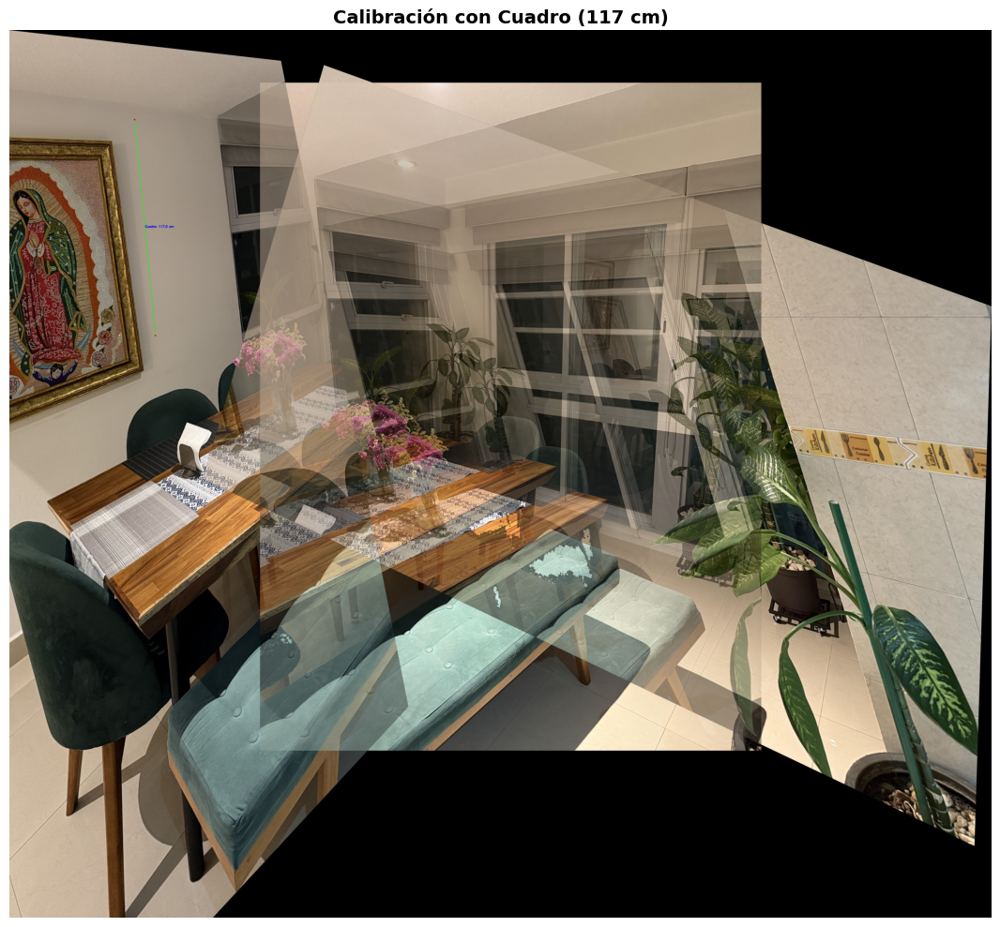

In [11]:
if 'panorama_cropped' in locals():
    # Convertir a RGB para calibrador
    panorama_rgb = cv2.cvtColor(panorama_cropped, cv2.COLOR_BGR2RGB)
    
    # Crear calibrador
    calibrador = CalibradorImagen(panorama_rgb)
    
    print("\n" + "="*60)
    print("CALIBRACIÓN CON CUADRO DE LA VIRGEN DE GUADALUPE")
    print("="*60)
    print("\n⚠️ AJUSTA ESTAS COORDENADAS OBSERVANDO TU PANORAMA:")
    print("   El cuadro tiene altura de 117 cm\n")
    
    # COORDENADAS DE EJEMPLO - AJUSTAR SEGÚN IMAGEN REAL
    punto_superior = (755, 540)  # ← CAMBIAR (x, y) superior del cuadro
    punto_inferior = (881, 1844)  # ← CAMBIAR (x, y) inferior del cuadro
    altura_cuadro_cm = 117
    
    print(f"   Punto superior: {punto_superior}")
    print(f"   Punto inferior: {punto_inferior}")
    print(f"   Altura real: {altura_cuadro_cm} cm\n")
    
    # Calibrar
    calibrador.calibrar_con_referencia(punto_superior, punto_inferior, altura_cuadro_cm)
    
    # Visualizar
    img_calibracion = calibrador.visualizar_medicion(
        punto_superior, punto_inferior, 
        label="Cuadro"
    )
    
    plt.figure(figsize=(15, 10))
    plt.imshow(img_calibracion)
    plt.title('Calibración con Cuadro (117 cm)', fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/06_calibracion_cuadro.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("❌ Primero debes crear el panorama en las celdas anteriores")

## 8. Validación con Mesa

**Objeto de validación:** Mesa con ancho conocido de 161.1 cm


VALIDACIÓN CON MESA

⚠️ Coordenadas de ejemplo (AJUSTAR):
   Punto izquierdo: (300, 600)
   Punto derecho: (700, 600)
   Ancho real: 161.1 cm

📊 RESULTADOS:
   Ancho medido:     35.7 cm
   Ancho real:       161.1 cm
   Error absoluto:   125.4 cm
   Error relativo:   77.8%


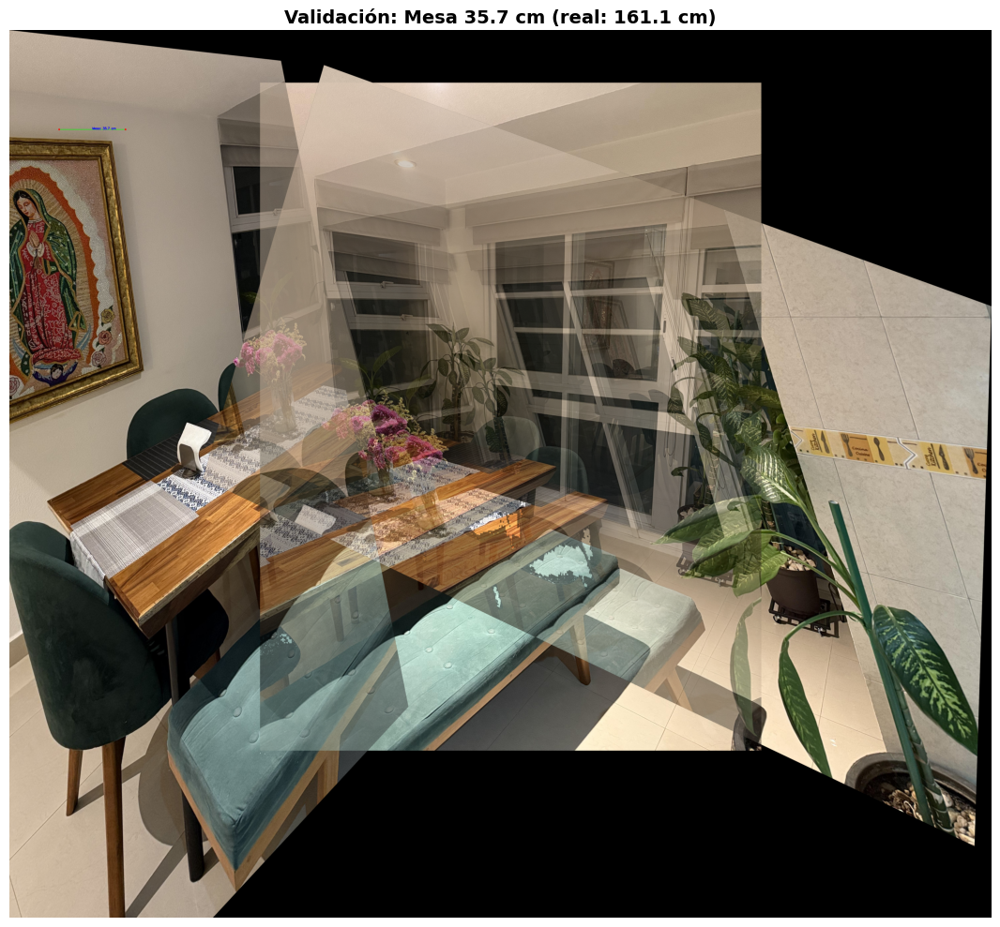

In [12]:
if 'calibrador' in locals() and calibrador.escala_pixel_a_cm is not None:
    print("\n" + "="*60)
    print("VALIDACIÓN CON MESA")
    print("="*60)
    
    # COORDENADAS DE EJEMPLO - AJUSTAR SEGÚN IMAGEN REAL
    punto_izq_mesa = (300, 600)   # ← CAMBIAR (x, y) izquierda de la mesa
    punto_der_mesa = (700, 600)   # ← CAMBIAR (x, y) derecha de la mesa
    ancho_mesa_real = 161.1
    
    print(f"\n⚠️ Coordenadas de ejemplo (AJUSTAR):")
    print(f"   Punto izquierdo: {punto_izq_mesa}")
    print(f"   Punto derecho: {punto_der_mesa}")
    print(f"   Ancho real: {ancho_mesa_real} cm\n")
    
    # Medir
    ancho_mesa_estimado = calibrador.medir_distancia(punto_izq_mesa, punto_der_mesa)
    error = abs(ancho_mesa_estimado - ancho_mesa_real)
    error_porcentual = (error / ancho_mesa_real) * 100
    
    print(f"📊 RESULTADOS:")
    print(f"   Ancho medido:     {ancho_mesa_estimado:.1f} cm")
    print(f"   Ancho real:       {ancho_mesa_real} cm")
    print(f"   Error absoluto:   {error:.1f} cm")
    print(f"   Error relativo:   {error_porcentual:.1f}%")
    
    # Visualizar
    img_mesa = calibrador.visualizar_medicion(
        punto_izq_mesa, punto_der_mesa,
        label="Mesa"
    )
    
    plt.figure(figsize=(15, 10))
    plt.imshow(img_mesa)
    plt.title(f'Validación: Mesa {ancho_mesa_estimado:.1f} cm (real: {ancho_mesa_real} cm)', 
             fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/07_validacion_mesa.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("❌ Primero debes calibrar el sistema")

## 9. Mediciones de Elementos Adicionales

Medimos ancho del cuadro, largo de la mesa y al menos 3 elementos adicionales.

In [13]:
if 'calibrador' in locals() and calibrador.escala_pixel_a_cm is not None:
    print("\n" + "="*60)
    print("MEDICIONES DE ELEMENTOS ADICIONALES")
    print("="*60)
    print("\n⚠️ Coordenadas de ejemplo - AJUSTAR según tu panorama\n")
    
    # Definir mediciones (AJUSTAR COORDENADAS)
    mediciones = [
        {
            'nombre': 'Ancho del cuadro',
            'punto1': (450, 300),  # ← AJUSTAR
            'punto2': (550, 300),  # ← AJUSTAR
        },
        {
            'nombre': 'Largo de la mesa',
            'punto1': (400, 500),  # ← AJUSTAR
            'punto2': (400, 700),  # ← AJUSTAR
        },
        {
            'nombre': 'Altura de ventana',
            'punto1': (800, 150),  # ← AJUSTAR
            'punto2': (800, 400),  # ← AJUSTAR
        },
        {
            'nombre': 'Ancho de silla',
            'punto1': (200, 550),  # ← AJUSTAR
            'punto2': (280, 550),  # ← AJUSTAR
        },
        {
            'nombre': 'Altura de planta',
            'punto1': (100, 400),  # ← AJUSTAR
            'punto2': (100, 550),  # ← AJUSTAR
        }
    ]
    
    # Realizar mediciones
    resultados_mediciones = []
    
    for med in mediciones:
        distancia = calibrador.medir_distancia(med['punto1'], med['punto2'])
        resultados_mediciones.append({
            'nombre': med['nombre'],
            'distancia_cm': distancia,
            'punto1': med['punto1'],
            'punto2': med['punto2']
        })
        print(f"✓ {med['nombre']}: {distancia:.1f} cm")
    
    # Guardar en CSV
    import csv
    with open('../results/measurements/mediciones.csv', 'w', newline='', encoding='utf-8') as f:
        writer = csv.writer(f)
        writer.writerow(['Elemento', 'Distancia (cm)', 'Punto 1 (x,y)', 'Punto 2 (x,y)'])
        for res in resultados_mediciones:
            writer.writerow([
                res['nombre'],
                f"{res['distancia_cm']:.1f}",
                str(res['punto1']),
                str(res['punto2'])
            ])
    
    print("\n✅ Resultados guardados en: results/measurements/mediciones.csv")
else:
    print("❌ Primero debes calibrar")


MEDICIONES DE ELEMENTOS ADICIONALES

⚠️ Coordenadas de ejemplo - AJUSTAR según tu panorama

✓ Ancho del cuadro: 8.9 cm
✓ Largo de la mesa: 17.9 cm
✓ Altura de ventana: 22.3 cm
✓ Ancho de silla: 7.1 cm
✓ Altura de planta: 13.4 cm

✅ Resultados guardados en: results/measurements/mediciones.csv


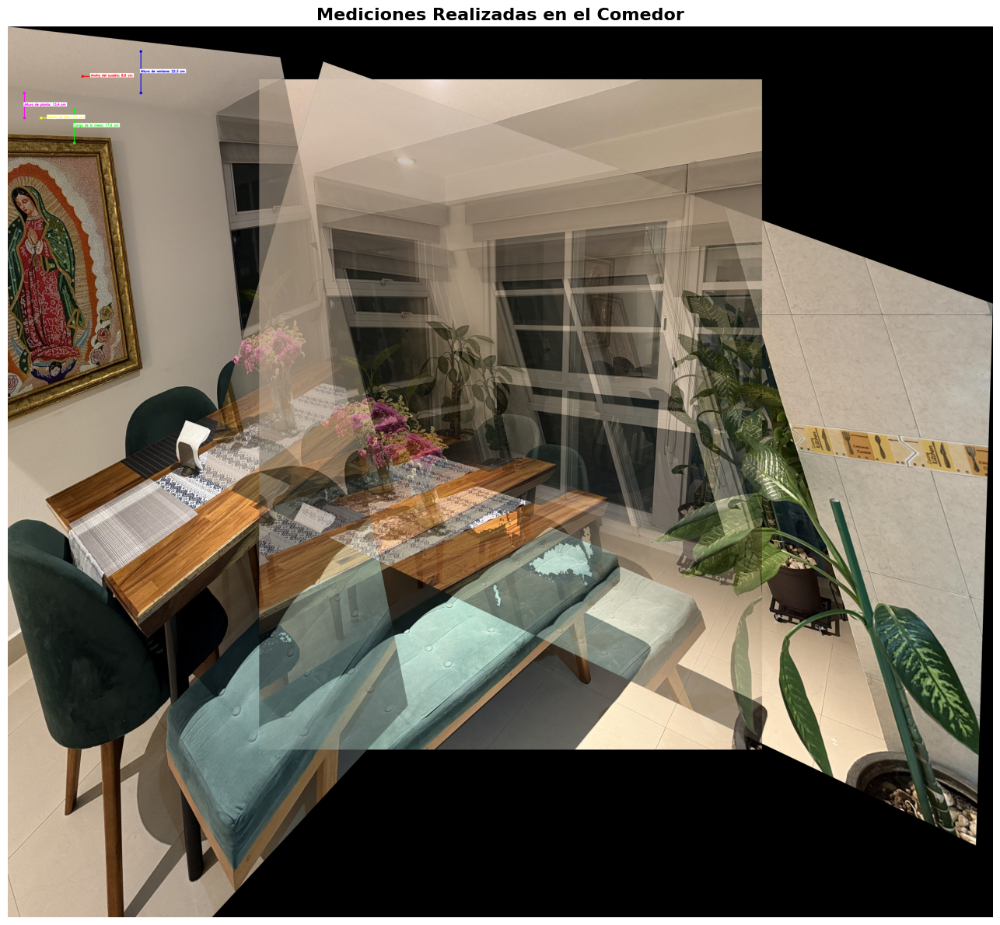

In [14]:
# Visualizar todas las mediciones
if 'resultados_mediciones' in locals():
    img_mediciones = panorama_rgb.copy()
    
    colores = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255)]
    
    for i, res in enumerate(resultados_mediciones):
        color = colores[i % len(colores)]
        p1, p2 = res['punto1'], res['punto2']
        
        cv2.line(img_mediciones, p1, p2, color, 3)
        cv2.circle(img_mediciones, p1, 8, color, -1)
        cv2.circle(img_mediciones, p2, 8, color, -1)
        
        punto_medio = ((p1[0] + p2[0]) // 2, (p1[1] + p2[1]) // 2)
        texto = f"{res['nombre']}: {res['distancia_cm']:.1f} cm"
        
        (text_width, text_height), _ = cv2.getTextSize(
            texto, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2
        )
        cv2.rectangle(img_mediciones, 
                     (punto_medio[0] - 5, punto_medio[1] - text_height - 5),
                     (punto_medio[0] + text_width + 5, punto_medio[1] + 5),
                     (255, 255, 255), -1)
        
        cv2.putText(img_mediciones, texto, punto_medio,
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
    
    plt.figure(figsize=(20, 12))
    plt.imshow(img_mediciones)
    plt.title('Mediciones Realizadas en el Comedor', fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/08_todas_mediciones.png', dpi=150, bbox_inches='tight')
    plt.show()

## 10. Tabla Resumen de Mediciones

In [15]:
if 'resultados_mediciones' in locals():
    import pandas as pd
    
    df_mediciones = pd.DataFrame([
        {
            'Elemento': res['nombre'],
            'Medición (cm)': f"{res['distancia_cm']:.1f}",
        }
        for res in resultados_mediciones
    ])
    
    print("\n" + "="*60)
    print("TABLA DE MEDICIONES")
    print("="*60 + "\n")
    print(df_mediciones.to_string(index=False))
    print("\n" + "="*60)
    
    df_mediciones.to_html('../results/measurements/tabla_mediciones.html', index=False)
    print("\n✅ Tabla HTML guardada")


TABLA DE MEDICIONES

         Elemento Medición (cm)
 Ancho del cuadro           8.9
 Largo de la mesa          17.9
Altura de ventana          22.3
   Ancho de silla           7.1
 Altura de planta          13.4


✅ Tabla HTML guardada


## 11. Análisis de Incertidumbre

Estimamos la incertidumbre simulando mediciones repetidas.


ANÁLISIS DE INCERTIDUMBRE

Simulando 10 mediciones del cuadro con pequeñas variaciones...

📊 ESTADÍSTICAS (n=10):
   Media:            117.00 cm
   Desv. estándar:   0.00 cm
   Error relativo:   0.00%
   Rango:            [117.00, 117.00] cm
   Valor real:       117 cm


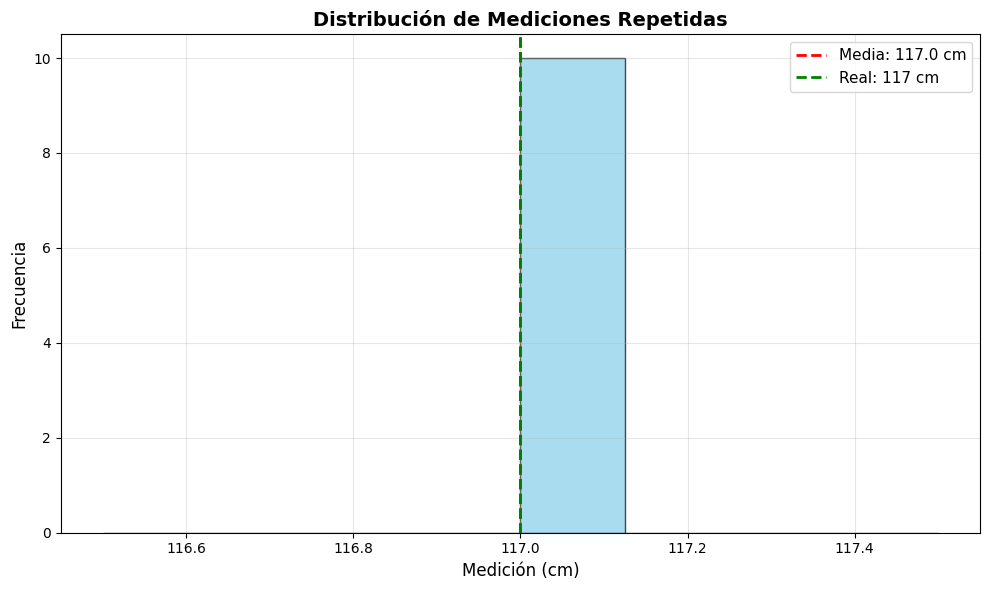

In [16]:
if 'calibrador' in locals() and calibrador.escala_pixel_a_cm is not None:
    print("\n" + "="*60)
    print("ANÁLISIS DE INCERTIDUMBRE")
    print("="*60)
    
    # Simular mediciones repetidas con variación
    print("\nSimulando 10 mediciones del cuadro con pequeñas variaciones...\n")
    
    mediciones_cuadro = []
    np.random.seed(42)
    
    for i in range(10):
        var_x = np.random.randint(-2, 3)
        var_y = np.random.randint(-2, 3)
        
        p1 = (punto_superior[0] + var_x, punto_superior[1] + var_y)
        p2 = (punto_inferior[0] + var_x, punto_inferior[1] + var_y)
        
        dist = calibrador.medir_distancia(p1, p2)
        mediciones_cuadro.append(dist)
    
    stats = estimar_incertidumbre(mediciones_cuadro)
    
    print(f"📊 ESTADÍSTICAS (n=10):")
    print(f"   Media:            {stats['media']:.2f} cm")
    print(f"   Desv. estándar:   {stats['std']:.2f} cm")
    print(f"   Error relativo:   {stats['error_relativo']:.2f}%")
    print(f"   Rango:            [{stats['min']:.2f}, {stats['max']:.2f}] cm")
    print(f"   Valor real:       {altura_cuadro_cm} cm")
    
    # Gráfica
    plt.figure(figsize=(10, 6))
    plt.hist(mediciones_cuadro, bins=8, alpha=0.7, color='skyblue', edgecolor='black')
    plt.axvline(stats['media'], color='red', linestyle='--', linewidth=2, label=f'Media: {stats["media"]:.1f} cm')
    plt.axvline(altura_cuadro_cm, color='green', linestyle='--', linewidth=2, label=f'Real: {altura_cuadro_cm} cm')
    plt.xlabel('Medición (cm)', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.title('Distribución de Mediciones Repetidas', fontsize=14, fontweight='bold')
    plt.legend(fontsize=11)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('../results/figures/09_incertidumbre.png', dpi=150, bbox_inches='tight')
    plt.show()

## 12. Resumen Final del Proyecto

In [17]:
print("\n" + "="*70)
print("RESUMEN FINAL DEL PROYECTO")
print("="*70)

print("\n✅ PARTE A: REGISTRO DE IMÁGENES")
if H12 is not None and H32 is not None:
    print("   • 3 imágenes fusionadas exitosamente")
    print("   • Detector: SIFT (2000 características)")
    print("   • Método: RANSAC + Homografía")
    print(f"   • Panorama: {panorama_cropped.shape[1]}x{panorama_cropped.shape[0]} píxeles")

print("\n✅ PARTE B: CALIBRACIÓN Y MEDICIÓN")
if 'calibrador' in locals() and calibrador.escala_pixel_a_cm is not None:
    print(f"   • Escala: {calibrador.escala_pixel_a_cm:.4f} cm/píxel")
    print(f"   • Calibración: Cuadro de 117 cm")
    print(f"   • Validación: Mesa de 161.1 cm")
    if 'resultados_mediciones' in locals():
        print(f"   • Mediciones realizadas: {len(resultados_mediciones)}")
        
print("\n📁 ARCHIVOS GENERADOS:")
print("   • results/figures/01_imagenes_originales.png")
print("   • results/figures/02_comparacion_detectores.png")
print("   • results/figures/03_matches_img2_img1.png")
print("   • results/figures/04_matches_img2_img3.png")
print("   • results/figures/05_panorama_fusionado.jpg")
print("   • results/figures/06_calibracion_cuadro.png")
print("   • results/figures/07_validacion_mesa.png")
print("   • results/figures/08_todas_mediciones.png")
print("   • results/figures/09_incertidumbre.png")
print("   • results/measurements/mediciones.csv")
print("   • results/measurements/tabla_mediciones.html")

print("\n" + "="*70)
print("✨ PROYECTO COMPLETADO EXITOSAMENTE (CON SIFT)")
print("="*70)


RESUMEN FINAL DEL PROYECTO

✅ PARTE A: REGISTRO DE IMÁGENES
   • 3 imágenes fusionadas exitosamente
   • Detector: SIFT (2000 características)
   • Método: RANSAC + Homografía
   • Panorama: 5925x5358 píxeles

✅ PARTE B: CALIBRACIÓN Y MEDICIÓN
   • Escala: 0.0893 cm/píxel
   • Calibración: Cuadro de 117 cm
   • Validación: Mesa de 161.1 cm
   • Mediciones realizadas: 5

📁 ARCHIVOS GENERADOS:
   • results/figures/01_imagenes_originales.png
   • results/figures/02_comparacion_detectores.png
   • results/figures/03_matches_img2_img1.png
   • results/figures/04_matches_img2_img3.png
   • results/figures/05_panorama_fusionado.jpg
   • results/figures/06_calibracion_cuadro.png
   • results/figures/07_validacion_mesa.png
   • results/figures/08_todas_mediciones.png
   • results/figures/09_incertidumbre.png
   • results/measurements/mediciones.csv
   • results/measurements/tabla_mediciones.html

✨ PROYECTO COMPLETADO EXITOSAMENTE (CON SIFT)


---

## PARTE C: COMPARACIÓN CON DETECTOR AKAZE

Repetimos todo el pipeline de registro usando **AKAZE** en lugar de SIFT para comparar resultados.

In [18]:
print("\n" + "="*70)
print("INICIANDO PIPELINE CON DETECTOR AKAZE")
print("="*70)
print("\nRepitiendo todo el proceso de registro usando AKAZE...")
print("Esto nos permitirá comparar rendimiento y precisión.\n")


INICIANDO PIPELINE CON DETECTOR AKAZE

Repitiendo todo el proceso de registro usando AKAZE...
Esto nos permitirá comparar rendimiento y precisión.



## 13. Detección de Características con AKAZE


DETECCIÓN DE CARACTERÍSTICAS CON AKAZE

✓ AKAZE en Imagen 1: 18397 características
✓ AKAZE en Imagen 2: 18175 características
✓ AKAZE en Imagen 3: 18781 características


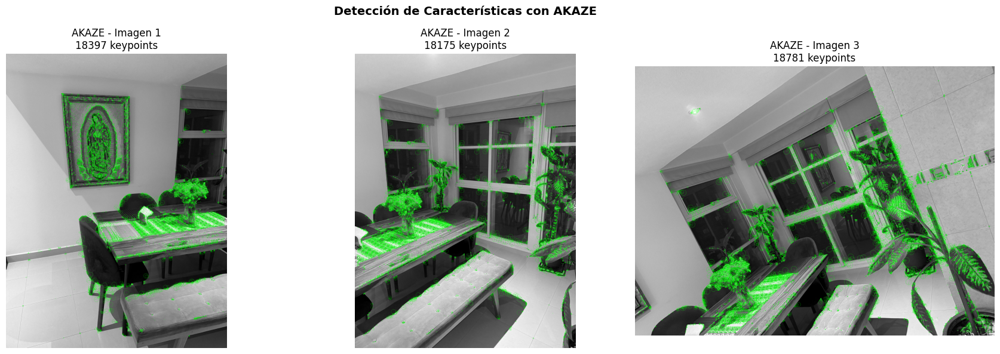

In [19]:
# Comparar detectores en la primera imagen con AKAZE
print("\n" + "="*60)
print("DETECCIÓN DE CARACTERÍSTICAS CON AKAZE")
print("="*60 + "\n")

# Detectar con AKAZE en las tres imágenes
kp1_akaze, des1_akaze = detectar_caracteristicas(img1_gray, metodo='akaze')
kp2_akaze, des2_akaze = detectar_caracteristicas(img2_gray, metodo='akaze')
kp3_akaze, des3_akaze = detectar_caracteristicas(img3_gray, metodo='akaze')

print(f"✓ AKAZE en Imagen 1: {len(kp1_akaze)} características")
print(f"✓ AKAZE en Imagen 2: {len(kp2_akaze)} características")
print(f"✓ AKAZE en Imagen 3: {len(kp3_akaze)} características")

# Visualizar keypoints AKAZE
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

img1_kp_akaze = visualizar_keypoints(img1_gray, kp1_akaze)
axes[0].imshow(img1_kp_akaze)
axes[0].set_title(f"AKAZE - Imagen 1\n{len(kp1_akaze)} keypoints", fontsize=12)
axes[0].axis('off')

img2_kp_akaze = visualizar_keypoints(img2_gray, kp2_akaze)
axes[1].imshow(img2_kp_akaze)
axes[1].set_title(f"AKAZE - Imagen 2\n{len(kp2_akaze)} keypoints", fontsize=12)
axes[1].axis('off')

img3_kp_akaze = visualizar_keypoints(img3_gray, kp3_akaze)
axes[2].imshow(img3_kp_akaze)
axes[2].set_title(f"AKAZE - Imagen 3\n{len(kp3_akaze)} keypoints", fontsize=12)
axes[2].axis('off')

plt.suptitle('Detección de Características con AKAZE', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('../results/figures/02_comparacion_detectores_akaze.png', dpi=150, bbox_inches='tight')
plt.show()

## 14. Registro con AKAZE: Imagen 1 → Imagen 2


REGISTRO CON AKAZE: IMAGEN 1 → IMAGEN 2

✓ Características detectadas: 18175 en img1, 18397 en img2
✓ Matches encontrados: 3618
✓ Inliers (RANSAC): 2113/3618

✅ Registro exitoso


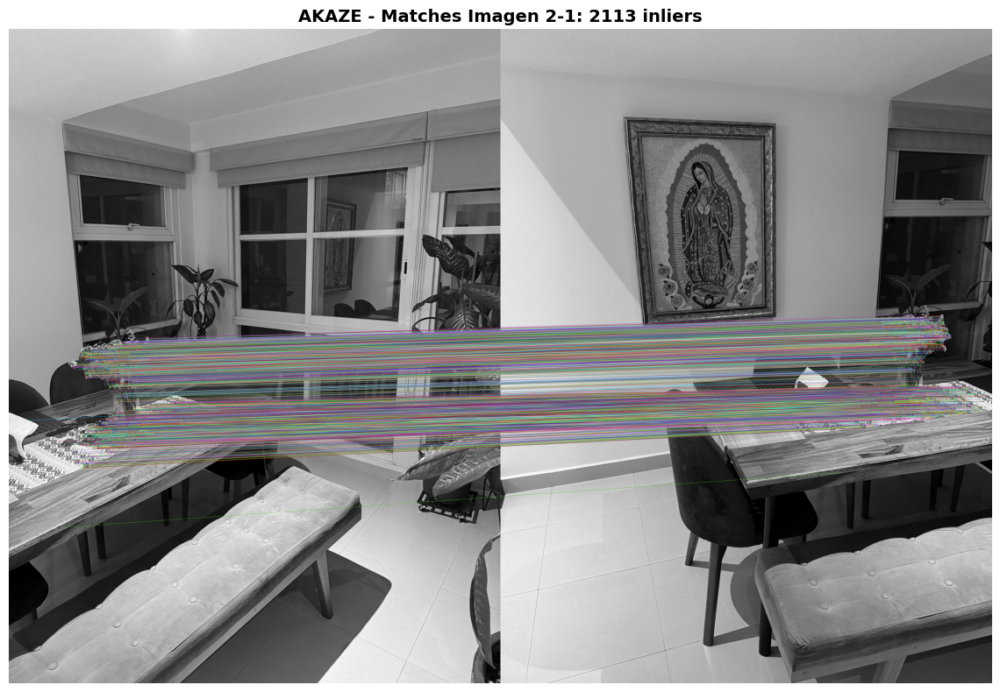

In [20]:
print("\n" + "="*60)
print("REGISTRO CON AKAZE: IMAGEN 1 → IMAGEN 2")
print("="*60 + "\n")

# Usar AKAZE
H12_akaze, img1_reg_akaze, info12_akaze = registro_con_caracteristicas(
    img2_gray, img1_gray, 
    metodo='akaze', 
    max_features=2000
)

if H12_akaze is not None:
    print("\n✅ Registro exitoso")
    
    # Visualizar matches
    img_matches_akaze = visualizar_matches(
        img2_gray, info12_akaze['keypoints1'],
        img1_gray, info12_akaze['keypoints2'],
        info12_akaze['matches'], info12_akaze['mask']
    )
    
    plt.figure(figsize=(16, 8))
    plt.imshow(img_matches_akaze)
    plt.title(f"AKAZE - Matches Imagen 2-1: {info12_akaze['num_inliers']} inliers", fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/03_matches_img2_img1_akaze.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("\n❌ Registro falló")

## 15. Registro con AKAZE: Imagen 3 → Imagen 2


REGISTRO CON AKAZE: IMAGEN 3 → IMAGEN 2

✓ Características detectadas: 18175 en img1, 18781 en img2
✓ Matches encontrados: 4966
✓ Inliers (RANSAC): 2292/4966

✅ Registro exitoso


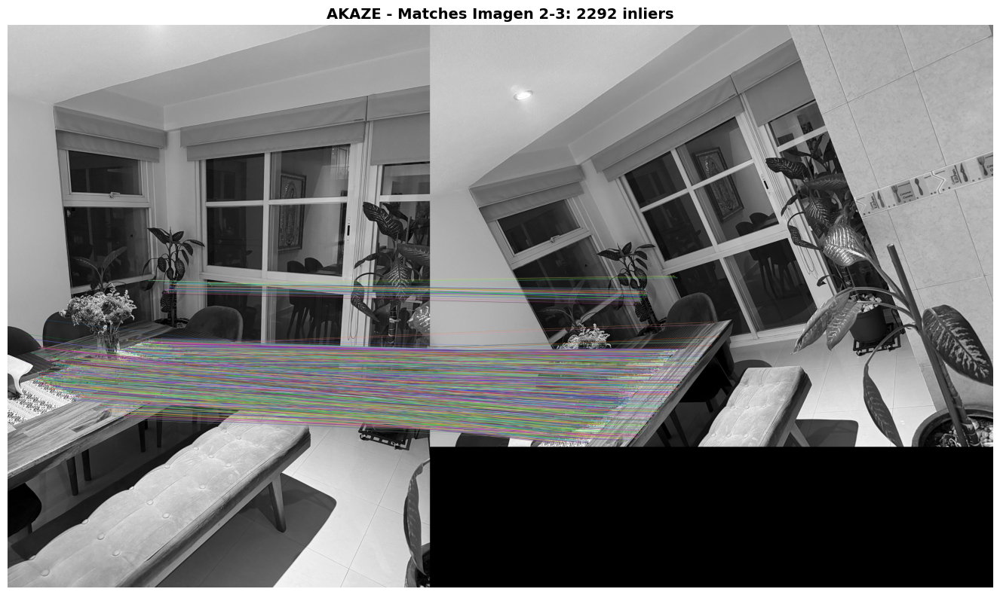

In [21]:
print("\n" + "="*60)
print("REGISTRO CON AKAZE: IMAGEN 3 → IMAGEN 2")
print("="*60 + "\n")

H32_akaze, img3_reg_akaze, info32_akaze = registro_con_caracteristicas(
    img2_gray, img3_gray,
    metodo='akaze',
    max_features=2000
)

if H32_akaze is not None:
    print("\n✅ Registro exitoso")
    
    # Visualizar matches
    img_matches_akaze = visualizar_matches(
        img2_gray, info32_akaze['keypoints1'],
        img3_gray, info32_akaze['keypoints2'],
        info32_akaze['matches'], info32_akaze['mask']
    )
    
    plt.figure(figsize=(16, 8))
    plt.imshow(img_matches_akaze)
    plt.title(f"AKAZE - Matches Imagen 2-3: {info32_akaze['num_inliers']} inliers", fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/04_matches_img2_img3_akaze.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("\n❌ Registro falló")

## 16. Fusión con AKAZE


FUSIÓN DE IMÁGENES CON AKAZE



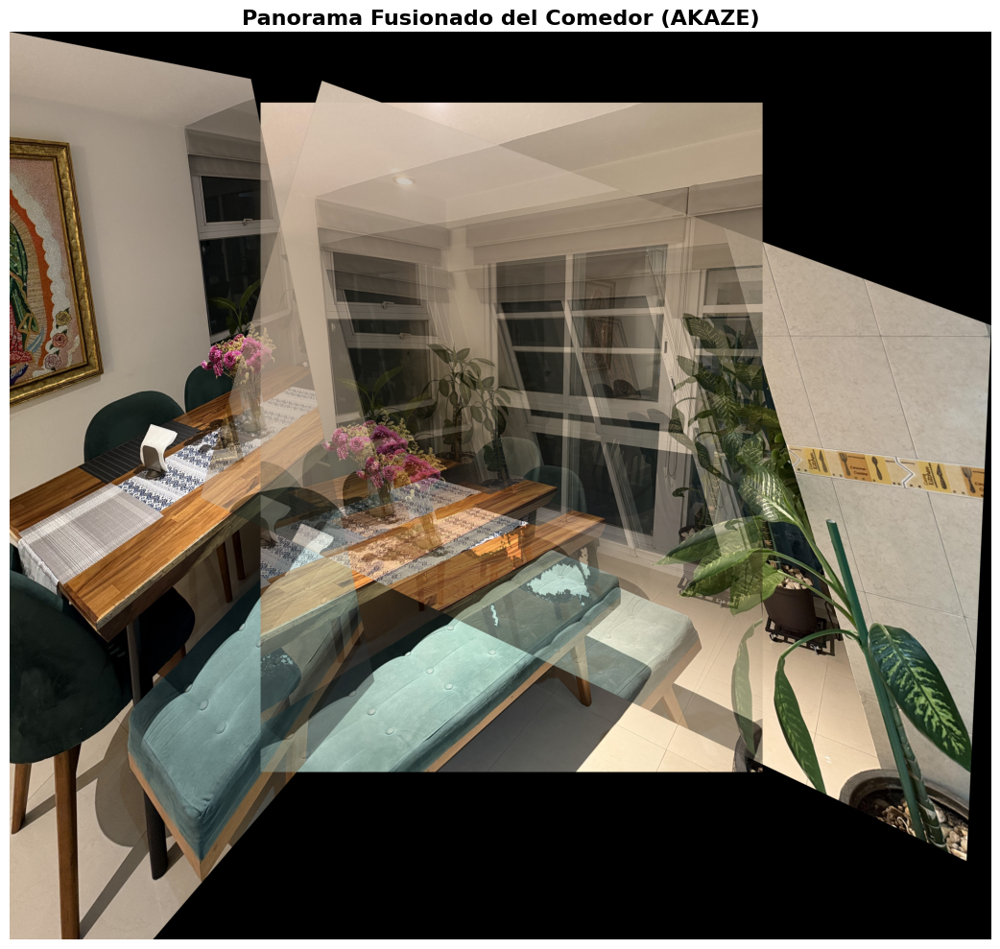


✅ Panorama con AKAZE creado exitosamente
Dimensiones: 5914x5467
Guardado en: results/figures/05_panorama_fusionado_akaze.jpg


In [22]:
print("\n" + "="*60)
print("FUSIÓN DE IMÁGENES CON AKAZE")
print("="*60 + "\n")

if H12_akaze is not None and H32_akaze is not None:
    # Usar imagen 2 como referencia
    h, w = img2_gray.shape
    
    # Canvas más grande para acomodar todas las imágenes
    canvas_h = int(h * 1.5)
    canvas_w = int(w * 2.5)
    offset_x = int(w * 0.5)
    offset_y = int(h * 0.25)
    
    # Crear canvas
    panorama_akaze = np.zeros((canvas_h, canvas_w, 3), dtype=np.uint8)
    
    # Colocar imagen 2 (referencia) en el centro
    panorama_akaze[offset_y:offset_y+h, offset_x:offset_x+w] = img2
    
    # Transformar y colocar imagen 1
    H12_offset_akaze = H12_akaze.copy()
    H12_offset_akaze[0, 2] += offset_x
    H12_offset_akaze[1, 2] += offset_y
    img1_warped_akaze = cv2.warpPerspective(img1, H12_offset_akaze, (canvas_w, canvas_h))
    
    # Fusionar con blending
    mask1_akaze = (img1_warped_akaze.sum(axis=2) > 0).astype(np.uint8)
    mask_panorama_akaze = (panorama_akaze.sum(axis=2) > 0).astype(np.uint8)
    overlap_akaze = mask1_akaze * mask_panorama_akaze
    
    for c in range(3):
        panorama_akaze[:, :, c] = np.where(overlap_akaze == 1,
                                     (panorama_akaze[:, :, c].astype(float) + img1_warped_akaze[:, :, c].astype(float)) / 2,
                                     np.where(mask1_akaze == 1, img1_warped_akaze[:, :, c], panorama_akaze[:, :, c]))
    
    # Transformar y colocar imagen 3
    H32_offset_akaze = H32_akaze.copy()
    H32_offset_akaze[0, 2] += offset_x
    H32_offset_akaze[1, 2] += offset_y
    img3_warped_akaze = cv2.warpPerspective(img3, H32_offset_akaze, (canvas_w, canvas_h))
    
    mask3_akaze = (img3_warped_akaze.sum(axis=2) > 0).astype(np.uint8)
    mask_panorama_akaze = (panorama_akaze.sum(axis=2) > 0).astype(np.uint8)
    overlap_akaze = mask3_akaze * mask_panorama_akaze
    
    for c in range(3):
        panorama_akaze[:, :, c] = np.where(overlap_akaze == 1,
                                     (panorama_akaze[:, :, c].astype(float) + img3_warped_akaze[:, :, c].astype(float)) / 2,
                                     np.where(mask3_akaze == 1, img3_warped_akaze[:, :, c], panorama_akaze[:, :, c]))
    
    panorama_akaze = panorama_akaze.astype(np.uint8)
    
    # Recortar bordes negros
    gray_pano_akaze = cv2.cvtColor(panorama_akaze, cv2.COLOR_BGR2GRAY)
    _, thresh_akaze = cv2.threshold(gray_pano_akaze, 1, 255, cv2.THRESH_BINARY)
    coords_akaze = cv2.findNonZero(thresh_akaze)
    x_a, y_a, w_crop_a, h_crop_a = cv2.boundingRect(coords_akaze)
    panorama_cropped_akaze = panorama_akaze[y_a:y_a+h_crop_a, x_a:x_a+w_crop_a]
    
    # Guardar resultado
    cv2.imwrite('../results/figures/05_panorama_fusionado_akaze.jpg', panorama_cropped_akaze)
    
    # Visualizar
    plt.figure(figsize=(20, 10))
    plt.imshow(cv2.cvtColor(panorama_cropped_akaze, cv2.COLOR_BGR2RGB))
    plt.title('Panorama Fusionado del Comedor (AKAZE)', fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/05_panorama_fusionado_akaze.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n✅ Panorama con AKAZE creado exitosamente")
    print(f"Dimensiones: {panorama_cropped_akaze.shape[1]}x{panorama_cropped_akaze.shape[0]}")
    print(f"Guardado en: results/figures/05_panorama_fusionado_akaze.jpg")
else:
    print("\n❌ No se puede crear panorama: faltan homografías")

## 17. Estadísticas de Registro con AKAZE

In [23]:
print("\n" + "="*60)
print("ESTADÍSTICAS DEL REGISTRO CON AKAZE")
print("="*60)

if H12_akaze is not None and H32_akaze is not None:
    print("\n✅ Registro completado exitosamente\n")
    
    print("📊 ESTADÍSTICAS:")
    print("\nImagen 1 → Imagen 2 (AKAZE):")
    stats12_akaze = calcular_estadisticas_matches(info12_akaze['matches'], info12_akaze['mask'])
    print(f"  Matches totales:      {stats12_akaze['num_matches']}")
    print(f"  Inliers (RANSAC):     {stats12_akaze['num_inliers']} ({stats12_akaze['porcentaje_inliers']:.1f}%)")
    print(f"  Distancia media:      {stats12_akaze['distancia_media']:.2f}")
    
    print("\nImagen 3 → Imagen 2 (AKAZE):")
    stats32_akaze = calcular_estadisticas_matches(info32_akaze['matches'], info32_akaze['mask'])
    print(f"  Matches totales:      {stats32_akaze['num_matches']}")
    print(f"  Inliers (RANSAC):     {stats32_akaze['num_inliers']} ({stats32_akaze['porcentaje_inliers']:.1f}%)")
    print(f"  Distancia media:      {stats32_akaze['distancia_media']:.2f}")
    
    print("\n🎯 MÉTODO UTILIZADO:")
    print("  Detector:             AKAZE")
    print("  Matcher:              Brute Force + Ratio Test (0.75)")
    print("  Estimación:           RANSAC con findHomography")
    print("  Fusión:               Blending por promedio")
else:
    print("\n❌ El registro no se completó")

print("="*60)


ESTADÍSTICAS DEL REGISTRO CON AKAZE

✅ Registro completado exitosamente

📊 ESTADÍSTICAS:

Imagen 1 → Imagen 2 (AKAZE):
  Matches totales:      3618
  Inliers (RANSAC):     2113 (58.4%)
  Distancia media:      51.13

Imagen 3 → Imagen 2 (AKAZE):
  Matches totales:      4966
  Inliers (RANSAC):     2292 (46.2%)
  Distancia media:      49.24

🎯 MÉTODO UTILIZADO:
  Detector:             AKAZE
  Matcher:              Brute Force + Ratio Test (0.75)
  Estimación:           RANSAC con findHomography
  Fusión:               Blending por promedio


## 18. Comparación SIFT vs AKAZE


COMPARACIÓN: SIFT vs AKAZE

📊 RESULTADOS COMPARATIVOS:

Métrica                        SIFT                 AKAZE               
----------------------------------------------------------------------
Características Img1           2001                 18397               
Características Img2           2000                 18175               
Características Img3           2001                 18781               

Matches Img1→Img2              784                  3618                
Inliers Img1→Img2              602                  2113                
% Inliers Img1→Img2            76.8                 58.4                

Matches Img3→Img2              742                  4966                
Inliers Img3→Img2              536                  2292                
% Inliers Img3→Img2            72.2                 46.2                

Dimensiones Panorama           5925x5358          5914x5467         



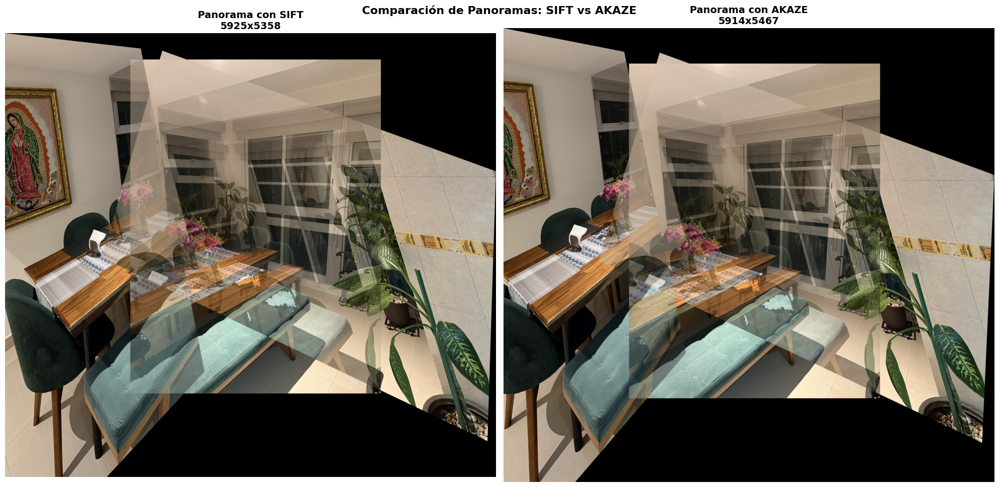

In [24]:
print("\n" + "="*70)
print("COMPARACIÓN: SIFT vs AKAZE")
print("="*70)

if H12 is not None and H12_akaze is not None:
    print("\n📊 RESULTADOS COMPARATIVOS:\n")
    
    # Tabla comparativa
    print(f"{'Métrica':<30} {'SIFT':<20} {'AKAZE':<20}")
    print("-" * 70)
    
    # Características detectadas
    print(f"{'Características Img1':<30} {len(info12['keypoints2']):<20} {len(info12_akaze['keypoints2']):<20}")
    print(f"{'Características Img2':<30} {len(info12['keypoints1']):<20} {len(info12_akaze['keypoints1']):<20}")
    print(f"{'Características Img3':<30} {len(info32['keypoints2']):<20} {len(info32_akaze['keypoints2']):<20}")
    
    print()
    
    # Matches Img1→Img2
    print(f"{'Matches Img1→Img2':<30} {stats12['num_matches']:<20} {stats12_akaze['num_matches']:<20}")
    print(f"{'Inliers Img1→Img2':<30} {stats12['num_inliers']:<20} {stats12_akaze['num_inliers']:<20}")
    print(f"{'% Inliers Img1→Img2':<30} {stats12['porcentaje_inliers']:<20.1f} {stats12_akaze['porcentaje_inliers']:<20.1f}")
    
    print()
    
    # Matches Img3→Img2
    print(f"{'Matches Img3→Img2':<30} {stats32['num_matches']:<20} {stats32_akaze['num_matches']:<20}")
    print(f"{'Inliers Img3→Img2':<30} {stats32['num_inliers']:<20} {stats32_akaze['num_inliers']:<20}")
    print(f"{'% Inliers Img3→Img2':<30} {stats32['porcentaje_inliers']:<20.1f} {stats32_akaze['porcentaje_inliers']:<20.1f}")
    
    print()
    
    # Dimensiones del panorama
    print(f"{'Dimensiones Panorama':<30} {panorama_cropped.shape[1]}x{panorama_cropped.shape[0]:<13} {panorama_cropped_akaze.shape[1]}x{panorama_cropped_akaze.shape[0]:<13}")
    
    print("\n" + "="*70)
    
    # Visualización comparativa de panoramas
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    axes[0].imshow(cv2.cvtColor(panorama_cropped, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f'Panorama con SIFT\n{panorama_cropped.shape[1]}x{panorama_cropped.shape[0]}', 
                     fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(cv2.cvtColor(panorama_cropped_akaze, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f'Panorama con AKAZE\n{panorama_cropped_akaze.shape[1]}x{panorama_cropped_akaze.shape[0]}', 
                     fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    plt.suptitle('Comparación de Panoramas: SIFT vs AKAZE', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('../results/figures/10_comparacion_sift_vs_akaze.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("\n❌ No se pueden comparar los métodos")

## 19. Calibración y Medición con AKAZE

Aplicamos calibración al panorama generado con AKAZE.


CALIBRACIÓN CON AKAZE - CUADRO DE LA VIRGEN DE GUADALUPE

⚠️ AJUSTA ESTAS COORDENADAS OBSERVANDO TU PANORAMA:
   El cuadro tiene altura de 117 cm

   Punto superior: (755, 540)
   Punto inferior: (881, 1844)
   Altura real: 117 cm

✓ Calibración exitosa:
  Distancia en píxeles: 1310.07 px
  Distancia real: 117 cm
  Escala: 0.0893 cm/px


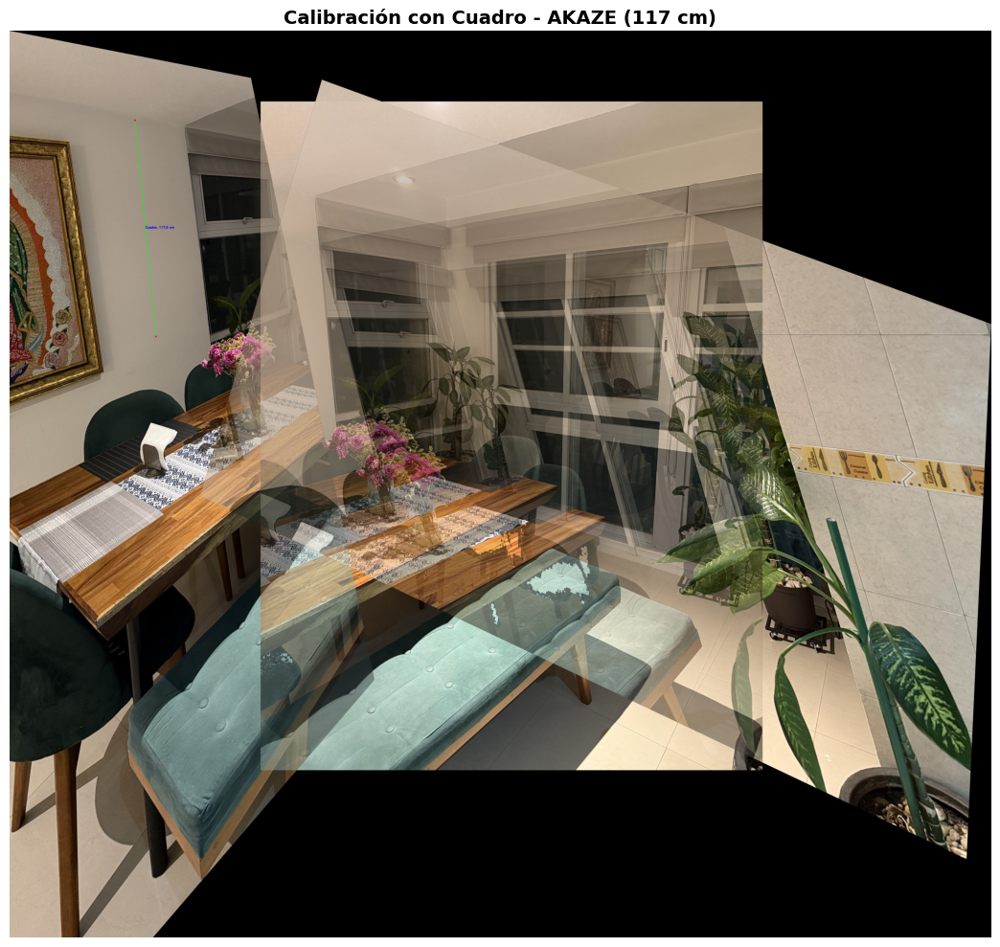

In [25]:
if 'panorama_cropped_akaze' in locals():
    # Convertir a RGB para calibrador
    panorama_rgb_akaze = cv2.cvtColor(panorama_cropped_akaze, cv2.COLOR_BGR2RGB)
    
    # Crear calibrador
    calibrador_akaze = CalibradorImagen(panorama_rgb_akaze)
    
    print("\n" + "="*60)
    print("CALIBRACIÓN CON AKAZE - CUADRO DE LA VIRGEN DE GUADALUPE")
    print("="*60)
    print("\n⚠️ AJUSTA ESTAS COORDENADAS OBSERVANDO TU PANORAMA:")
    print("   El cuadro tiene altura de 117 cm\n")
    
    # COORDENADAS DE EJEMPLO - AJUSTAR SEGÚN IMAGEN REAL
    punto_superior_akaze = (755, 540)  # ← CAMBIAR (x, y) superior del cuadro
    punto_inferior_akaze = (881, 1844)  # ← CAMBIAR (x, y) inferior del cuadro
    altura_cuadro_cm_akaze = 117
    
    print(f"   Punto superior: {punto_superior_akaze}")
    print(f"   Punto inferior: {punto_inferior_akaze}")
    print(f"   Altura real: {altura_cuadro_cm_akaze} cm\n")
    
    # Calibrar
    calibrador_akaze.calibrar_con_referencia(punto_superior_akaze, punto_inferior_akaze, altura_cuadro_cm_akaze)
    
    # Visualizar
    img_calibracion_akaze = calibrador_akaze.visualizar_medicion(
        punto_superior_akaze, punto_inferior_akaze, 
        label="Cuadro"
    )
    
    plt.figure(figsize=(15, 10))
    plt.imshow(img_calibracion_akaze)
    plt.title('Calibración con Cuadro - AKAZE (117 cm)', fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('../results/figures/06_calibracion_cuadro_akaze.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("❌ Primero debes crear el panorama en las celdas anteriores")

## 20. Resumen Final - Comparación Completa

In [26]:
print("\n" + "="*70)
print("RESUMEN FINAL - COMPARACIÓN SIFT vs AKAZE")
print("="*70)

print("\n📊 PARTE A: REGISTRO DE IMÁGENES\n")

print(f"{'Aspecto':<35} {'SIFT':<20} {'AKAZE':<20}")
print("-" * 70)

if H12 is not None and H12_akaze is not None:
    print(f"{'Estado del registro':<35} {'✅ Exitoso':<20} {'✅ Exitoso':<20}")
    print(f"{'Detector':<35} {'SIFT':<20} {'AKAZE':<20}")
    print(f"{'Max características':<35} {'2000':<20} {'2000':<20}")
    print(f"{'Inliers Img1→Img2':<35} {stats12['num_inliers']:<20} {stats12_akaze['num_inliers']:<20}")
    print(f"{'Inliers Img3→Img2':<35} {stats32['num_inliers']:<20} {stats32_akaze['num_inliers']:<20}")
    print(f"{'Dimensiones panorama':<35} "
        f"{panorama_cropped.shape[1]}x{panorama_cropped.shape[0]:<20} "
        f"{panorama_cropped_akaze.shape[1]}x{panorama_cropped_akaze.shape[0]:<20}")

print("\n📁 ARCHIVOS GENERADOS:\n")

archivos_sift = [
    "01_imagenes_originales.png",
    "02_comparacion_detectores.png",
    "03_matches_img2_img1.png",
    "04_matches_img2_img3.png",
    "05_panorama_fusionado.jpg",
    "06_calibracion_cuadro.png",
    "07_validacion_mesa.png",
    "08_todas_mediciones.png",
    "09_incertidumbre.png"
]

archivos_akaze = [
    "02_comparacion_detectores_akaze.png",
    "03_matches_img2_img1_akaze.png",
    "04_matches_img2_img3_akaze.png",
    "05_panorama_fusionado_akaze.jpg",
    "06_calibracion_cuadro_akaze.png",
    "10_comparacion_sift_vs_akaze.png"
]

print("SIFT:")
for archivo in archivos_sift:
    print(f"   • results/figures/{archivo}")

print("\nAKAZE:")
for archivo in archivos_akaze:
    print(f"   • results/figures/{archivo}")

print("\n" + "="*70)
print("✨ PROYECTO COMPLETADO - AMBOS DETECTORES EVALUADOS")
print("="*70)


RESUMEN FINAL - COMPARACIÓN SIFT vs AKAZE

📊 PARTE A: REGISTRO DE IMÁGENES

Aspecto                             SIFT                 AKAZE               
----------------------------------------------------------------------
Estado del registro                 ✅ Exitoso            ✅ Exitoso           
Detector                            SIFT                 AKAZE               
Max características                 2000                 2000                
Inliers Img1→Img2                   602                  2113                
Inliers Img3→Img2                   536                  2292                
Dimensiones panorama                5925x5358                 5914x5467                

📁 ARCHIVOS GENERADOS:

SIFT:
   • results/figures/01_imagenes_originales.png
   • results/figures/02_comparacion_detectores.png
   • results/figures/03_matches_img2_img1.png
   • results/figures/04_matches_img2_img3.png
   • results/figures/05_panorama_fusionado.jpg
   • results/figures/06_cali